In [1]:
import fastbook
fastbook.setup_book()

In [2]:
from fastbook import *

In [3]:
from fastai.data.external import untar_data,URLs
from fastai.data.transforms import get_image_files

In [4]:
path = Path("dataset-original/") #started typing and did autocomplete

In [48]:
files = get_image_files(path/'cardboard')

In [52]:
parent_label(files[0]) #cardboard

'cardboard'

In [151]:
##Dataloaders??

In [50]:
import PIL

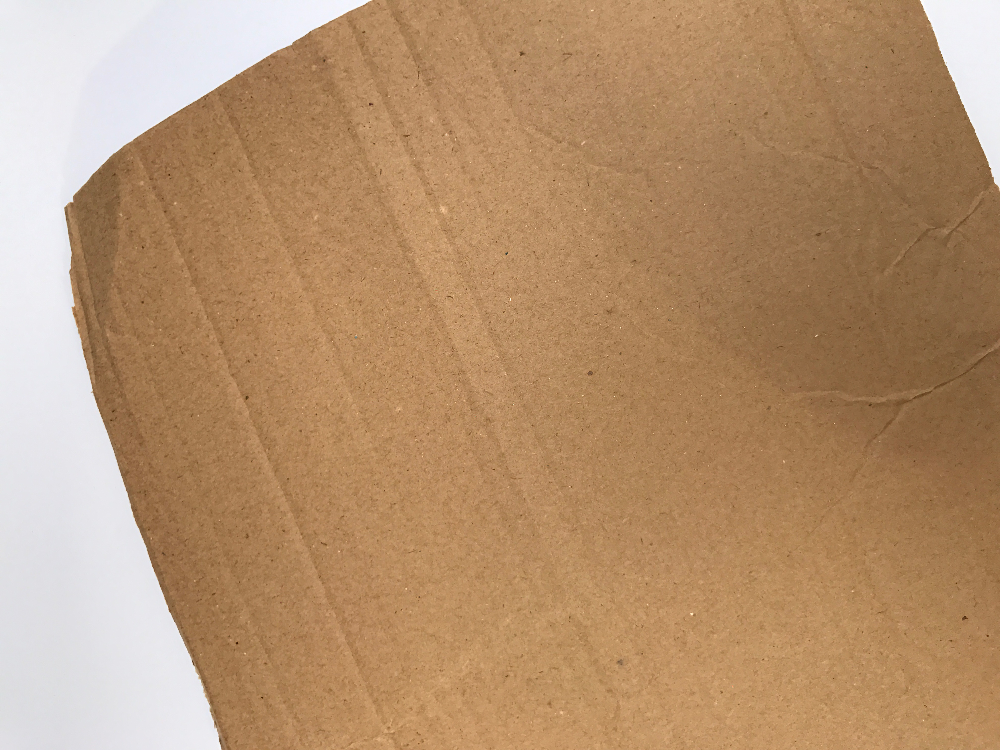

In [51]:
img = PIL.Image.open(files[0])
img

In [32]:
device = {'cuda:0' if torch.cuda.is_available() else 'cpu'}
device

{'cuda:0'}

In [33]:
torch.cuda.is_available()

True

In [37]:
# def open_image(fname, size=224):
#     img = PIL.Image.open(fname).convert('RGB')
#     img = img.resize((size, size))
#     t = torch.Tensor(np.array(img))
#     return t.permute(2,0,1).float()/255.0

In [ ]:
#TODO: NEED TO APPLY THIS FUNCTION TO ALL IMAGES!!! (OR NONE AT ALL) SINCE NOW THEY ARE OF DIF. SIZES

In [10]:
trash_types = 'cardboard','glass','metal','paper','plastic','trash'
#path = Path("dataset-original/") #started typing and did autocomplete

In [18]:
if not path.exists():
    print("No path")
    path.mkdir() #existed
#Made the empty folders below
for t in trash_types:
    dest = (path/t)
    dest.mkdir(exist_ok=True) 


In [152]:
# import glob
# for item in glob.glob(path):
#     print(item)
# # for f in path:
# #     print('hi')

In [153]:
#!ls ${path}/

In [24]:
fns = get_image_files(path)
fns

(#2527) [Path('dataset-original/glass/glass62.jpg'),Path('dataset-original/glass/glass403.jpg'),Path('dataset-original/glass/glass448.jpg'),Path('dataset-original/glass/glass74.jpg'),Path('dataset-original/glass/glass266.jpg'),Path('dataset-original/glass/glass26.jpg'),Path('dataset-original/glass/glass125.jpg'),Path('dataset-original/glass/glass412.jpg'),Path('dataset-original/glass/glass362.jpg'),Path('dataset-original/glass/glass323.jpg')...]

In [25]:
failed = verify_images(fns)

In [26]:
failed

(#0) []

In [154]:
#path/'cardboard'

In [155]:
parent_label??

In [38]:
trash = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items =get_image_files,
        splitter = RandomSplitter(valid_pct=0.2, seed=42),
        get_y = parent_label, #get label from parent folder
        item_tfms = Resize(128)
)

In [156]:
#display(trash)

In [56]:
dls = trash.dataloaders(path, device='cuda:0')
#no Could not do one pass in your dataloader, there is something wrong in it
#after changed from device = device to device = 'cuda:0'

In [157]:
trash.dataloaders??

In [55]:
dls.one_batch()

(TensorImage([[[[0.7216, 0.7255, 0.7255,  ..., 0.4706, 0.4706, 0.4706],
           [0.7294, 0.7294, 0.7294,  ..., 0.4706, 0.4745, 0.4706],
           [0.7333, 0.7294, 0.7294,  ..., 0.4706, 0.4706, 0.4667],
           ...,
           [0.9490, 0.9490, 0.9529,  ..., 0.7216, 0.7137, 0.7098],
           [0.9490, 0.9451, 0.9490,  ..., 0.7176, 0.7137, 0.7098],
           [0.9451, 0.9451, 0.9490,  ..., 0.7176, 0.7098, 0.7020]],
 
          [[0.5843, 0.5804, 0.5765,  ..., 0.4353, 0.4392, 0.4353],
           [0.5882, 0.5882, 0.5843,  ..., 0.4353, 0.4353, 0.4353],
           [0.5922, 0.5882, 0.5882,  ..., 0.4392, 0.4392, 0.4353],
           ...,
           [0.8588, 0.8588, 0.8627,  ..., 0.7020, 0.6980, 0.6941],
           [0.8588, 0.8588, 0.8588,  ..., 0.6980, 0.6980, 0.6902],
           [0.8588, 0.8588, 0.8588,  ..., 0.6941, 0.6902, 0.6863]],
 
          [[0.4392, 0.4431, 0.4392,  ..., 0.3882, 0.3882, 0.3922],
           [0.4431, 0.4510, 0.4471,  ..., 0.3922, 0.3922, 0.3922],
           [0.4510,

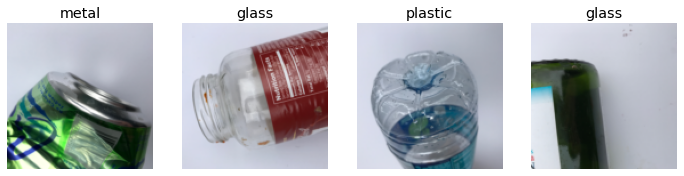

In [57]:
dls.valid.show_batch(max_n=4, nrows=1)

In [ ]:
#TRYING TRAINING ALONG WITH P. 75

In [58]:
trash = trash.new(
        item_tfms=RandomResizedCrop(224,min_scale=0.5),
        batch_tfms=aug_transforms())
dls = trash.dataloaders(path,device='cuda:0')

/home/dpv/anaconda3/envs/fastai_conda/lib/python3.9/site-packages/torch/_tensor.py:1051: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180549130/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  ret = func(*args, **kwargs)


In [59]:
learn = cnn_learner(dls, resnet18, metrics=error_rate) 

#### I think the Learnter automatically puts the model to device. No need to do model.to(device) like in Torch

In [60]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.811117,0.673830,0.215842,01:14


epoch,train_loss,valid_loss,error_rate,time
0,0.802700,0.504568,0.160396,01:15
1,0.625307,0.409253,0.142574,01:17
2,0.480807,0.398619,0.146535,01:17
3,0.372067,0.381660,0.122772,01:16


epoch 	train_loss 	valid_loss 	error_rate 	time
0 	1.811117 	0.673830 	0.215842 	01:14
epoch 	train_loss 	valid_loss 	error_rate 	time
0 	0.802700 	0.504568 	0.160396 	01:15
1 	0.625307 	0.409253 	0.142574 	01:17
2 	0.480807 	0.398619 	0.146535 	01:17
3 	0.372067 	0.381660 	0.122772 	01:16

In [61]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)

In [62]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.850513,0.701962,0.190099,01:15


epoch,train_loss,valid_loss,error_rate,time
0,0.843094,0.519648,0.158416,01:16
1,0.722866,0.470383,0.158416,01:17
2,0.559567,0.385397,0.124752,01:18
3,0.430692,0.362533,0.112871,01:19
4,0.337006,0.360453,0.112871,01:18
5,0.252257,0.313348,0.085149,01:19
6,0.194242,0.357489,0.100990,01:20
7,0.146675,0.308736,0.089109,01:19
8,0.122154,0.286139,0.085149,01:22
9,0.112551,0.296070,0.091089,01:37


 epoch 	train_loss 	valid_loss 	error_rate 	time
0 	1.850513 	0.701962 	0.190099 	01:15
epoch 	train_loss 	valid_loss 	error_rate 	time
0 	0.843094 	0.519648 	0.158416 	01:16
1 	0.722866 	0.470383 	0.158416 	01:17
2 	0.559567 	0.385397 	0.124752 	01:18
3 	0.430692 	0.362533 	0.112871 	01:19
4 	0.337006 	0.360453 	0.112871 	01:18
5 	0.252257 	0.313348 	0.085149 	01:19
6 	0.194242 	0.357489 	0.100990 	01:20
7 	0.146675 	0.308736 	0.089109 	01:19
8 	0.122154 	0.286139 	0.085149 	01:22
9 	0.112551 	0.296070 	0.091089 	01:37

In [74]:
# lrfind = LRFinder()
# #learn.cbs=learn.cbs+[lrfind]
# learn.cbs = [TrainEvalCallback,Recorder,ProgressCallback,LRFinder]
# learn.cbs 

[fastai.callback.core.TrainEvalCallback,
 fastai.learner.Recorder,
 fastai.callback.progress.ProgressCallback,
 fastai.callback.schedule.LRFinder]

In [84]:
# learn = cnn_learner(dls, resnet18, metrics=error_rate)
# learn.cbs = learn.cbs+[lrfind]
# learn.cbs

(#4) [TrainEvalCallback,Recorder,ProgressCallback,LRFinder]

In [135]:
# learn.fine_tune(1)

In [88]:
cbs=[TrainEvalCallback(),
 Recorder(),
 ProgressCallback()]
lrfind=LRFinder()
learn = cnn_learner(dls, resnet18, metrics=error_rate, cbs=cbs+[lrfind])

In [89]:
learn.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time


epoch,train_loss,valid_loss,error_rate,time


In [90]:
learn.cbs

(#7) [TrainEvalCallback,Recorder,ProgressCallback,TrainEvalCallback,Recorder,ProgressCallback,LRFinder]

In [134]:
# plt.plot(lrfind.lrs[:-2], lrfind.losses[:-2])
# plt.xscale('log')
# NOT WORKING

In [95]:
lrfind=LRFinder()
cbs = [TrainEvalCallback(),
 Recorder(),
 ProgressCallback(),
 SaveModelCallback(every_epoch=True)]
learn = cnn_learner(dls, resnet18, metrics=error_rate, cbs=cbs)

In [105]:
cbs = [] #must occasionally clean up your list
learn = cnn_learner(dls, resnet18, metrics=error_rate,cbs=cbs+[SaveModelCallback(every_epoch=True)])

In [106]:
learn.cbs 

(#4) [TrainEvalCallback,Recorder,ProgressCallback,SaveModelCallback]

In [107]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.760472,0.639008,0.223762,01:24


epoch,train_loss,valid_loss,error_rate,time
0,0.848104,0.542473,0.196040,01:28
1,0.684445,0.447180,0.154455,01:27
2,0.573362,0.472952,0.144554,01:26
3,0.460479,0.350205,0.099010,01:29
4,0.343618,0.357197,0.110891,01:29
5,0.264540,0.375858,0.124752,01:26
6,0.201217,0.329097,0.102970,01:27
7,0.157736,0.308786,0.091089,01:26
8,0.134358,0.308325,0.095050,01:28
9,0.115339,0.309205,0.093069,01:27


 epoch 	train_loss 	valid_loss 	error_rate 	time
0 	1.680363 	0.688131 	0.227723 	01:21
epoch 	train_loss 	valid_loss 	error_rate 	time
0 	0.816186 	0.587929 	0.203960 	01:25
1 	0.665894 	0.488878 	0.142574 	01:25
2 	0.531409 	0.424168 	0.134653 	01:25
3 	0.408662 	0.435908 	0.132673 	01:25
4 	0.313750 	0.352179 	0.104950 	01:27
5 	0.246948 	0.336746 	0.104950 	01:26
6 	0.191810 	0.341128 	0.099010 	01:28   #saved to model_6.pth, learn how to load it
7 	0.158596 	0.336245 	0.104950 	01:26


 epoch 	train_loss 	valid_loss 	error_rate 	time
0 	1.760472 	0.639008 	0.223762 	01:24
epoch 	train_loss 	valid_loss 	error_rate 	time
0 	0.848104 	0.542473 	0.196040 	01:28
1 	0.684445 	0.447180 	0.154455 	01:27
2 	0.573362 	0.472952 	0.144554 	01:26
3 	0.460479 	0.350205 	0.099010 	01:29
4 	0.343618 	0.357197 	0.110891 	01:29
5 	0.264540 	0.375858 	0.124752 	01:26
6 	0.201217 	0.329097 	0.102970 	01:27
7 	0.157736 	0.308786 	0.091089 	01:26
8 	0.134358 	0.308325 	0.095050 	01:28
9 	0.115339 	0.309205 	0.093069 	01:27

In [108]:
learn.export()

In [109]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [112]:
#For practice, loading from pickle file
learn_inf = load_learner(path/'export.pkl')

In [114]:
learn_inf.predict(path/'image.jpeg')

('glass',
 TensorBase(1),
 TensorBase([6.4178e-08, 9.9977e-01, 6.7105e-07, 2.1796e-07, 2.2935e-04, 3.8251e-06]))

In [116]:
learn_inf.predict(path/'image2.png')

('plastic',
 TensorBase(4),
 TensorBase([4.4445e-04, 3.8089e-04, 4.2420e-01, 1.8869e-03, 5.5797e-01, 1.5113e-02]))

In [117]:
learn_inf.dls.vocab

['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

In [38]:
open_image(files[0]).shape

torch.Size([3, 224, 224])

In [119]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [150]:
#btn_upload.data #[], must first upload

In [125]:
img = PILImage.create(btn_upload.data[-1])

In [126]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [127]:
pred,pred_idx, probs = learn_inf.predict(img)

In [128]:
lbl_pred = widgets.Label()
lbl_pred.value = f"Prediction: {pred}; Probability: {probs[pred_idx]:.04f}"
lbl_pred

Label(value='Prediction: metal; Probability: 0.9778')

In [145]:
btn_run = widgets.Button(decription='Classify',tooltip="Click")
btn_run

Button(style=ButtonStyle(), tooltip='Click')

In [146]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred, pred_idx, probs = learn_inf.predict(img)
    lbl_pred.value = f"Prediction: {pred}; Probability: {probs[pred_idx]:.04f}"

In [147]:
btn_run.on_click(on_click_classify)

In [148]:
from ipywidgets import *

In [149]:
VBox([widgets.Label("Lelect your object!"),
      btn_upload, btn_run, out_pl, lbl_pred])

# TODOS
##### *Play more with finetuning learning rate (lr_finder callback?) Just run lr_finder for a bit first?  What is the default behaviour of learn_fine tune (does it autoadjust the rate)?
##### *Figure out if the best model is being exported (working with SaveModelCallback and getting data back)
##### *Try different architecture (resnet34?)
##### *Get more data
##### *App deployment (fastai p. 84)
##### *Try building the same in pure Torch (just use the dataloaders from fastai), compare and contrast

Long term...
##### *Look into Vila.* guy's app.  Flask/React deployment

# EXTRAS BELOW

In [39]:
#open_image(files[0]).device

device(type='cpu')

In [26]:
# #import re
# def label_func(fname):
#     return re.match(r'^([a-z]*)\d+.jpg$', fname.name).groups()[0]

# label_func(files[0])

'cardboard'

In [40]:
# labels = list(set(files.map(label_func)))
# len(labels)

6

In [41]:
# device

{'cuda:0'}

In [24]:
# idxs = np.random.permutation(range(len(files)))
# cut = int(0.8 * len(files))
# train_files = files[idxs[:cut]]
# valid_files = files[idxs[cut:]]

In [42]:
# pat = r'^([a-z]*)\d+.jpg$'
# #dls = ImageDataLoaders.from_path_re(path, files, label_func, item_tfms=Resize(224),device='cuda:0')
# dls=ImageDataLoaders.from_name_re(path, files, pat, bs=16, val_bs=None, shuffle=True, device='cuda:0')

In [133]:
# dls.show_batch()

In [ ]:
# learn = cnn_learner(dls, resnet34, metrics=error_rate)
# learn.fine_tune(1)